<a href="https://colab.research.google.com/github/YannisZang/CS5864_CV/blob/main/HW2/part2_part3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CS 5864 Homework 2, Parts 2 and 3: Image Stitching and Epipolar Geometry

In [ ]:
import numpy as np
import random
from pathlib import Path
import cv2
from matplotlib import pyplot as plt

try:
    from skimage.transform import ProjectiveTransform, warp
except Exception:
    ProjectiveTransform = None
    warp = None

np.random.seed(0)
random.seed(0)
plt.rcParams['figure.figsize'] = (6,4)
plt.rcParams['figure.dpi'] = 120


In [ ]:
IMG1_PATH = 'image_1.jpg'
IMG2_PATH = 'image_2.jpg'

In [ ]:
def imread_rgb(path):
    img = cv2.imread(str(path), cv2.IMREAD_COLOR)
    if img is None:
        raise FileNotFoundError(path)
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def to_gray_u8(rgb):
    return cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)

def show(title, image):
    plt.figure(); plt.title(title)
    if image.ndim == 2:
        plt.imshow(image, cmap='gray', vmin=0, vmax=255)
    else:
        plt.imshow(image)
    plt.axis('off'); plt.show()


## 1) Load + grayscale

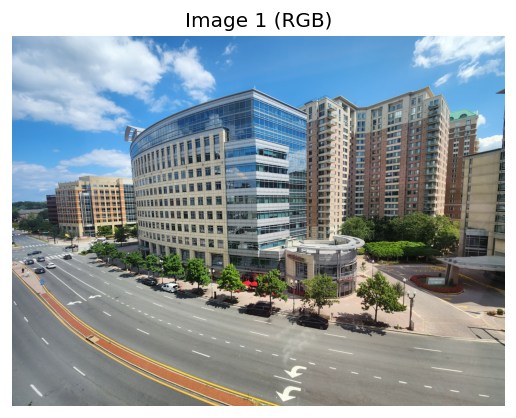

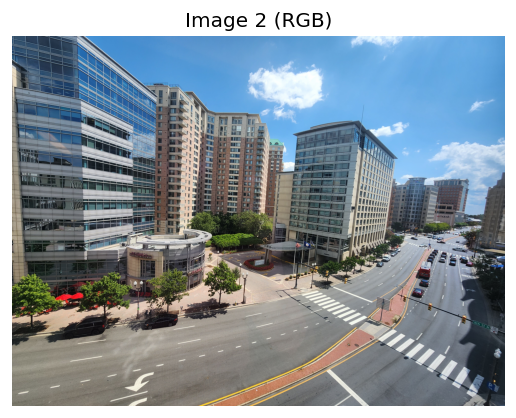

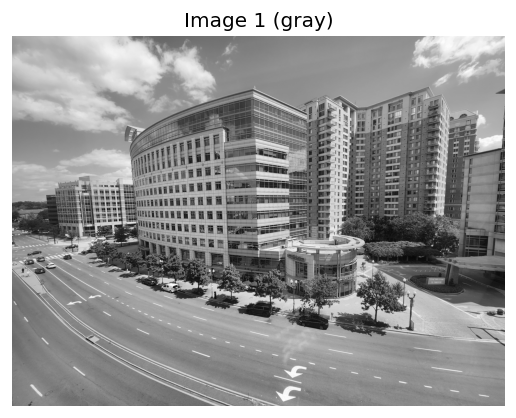

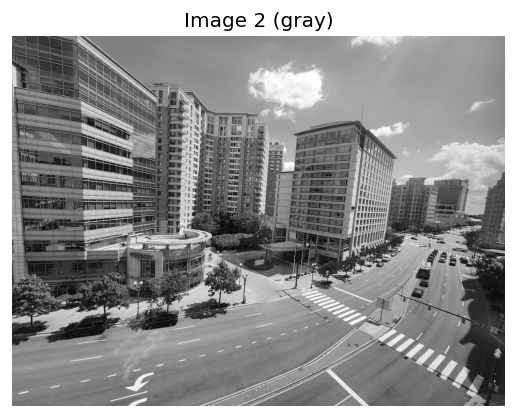

In [ ]:
img1_rgb = imread_rgb(IMG1_PATH)
img2_rgb = imread_rgb(IMG2_PATH)
img1 = to_gray_u8(img1_rgb)
img2 = to_gray_u8(img2_rgb)
show('Image 1 (RGB)', img1_rgb)
show('Image 2 (RGB)', img2_rgb)
show('Image 1 (gray)', img1)
show('Image 2 (gray)', img2)

## 2) SIFT keypoints/descriptors + visualization
Use OpenCV SIFT `detectAndCompute`. Display keypoints with `cv2.drawKeypoints`.

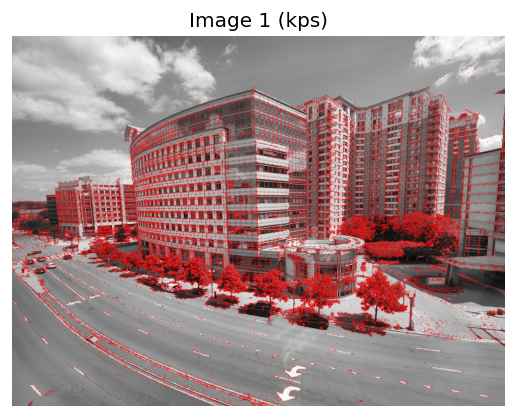

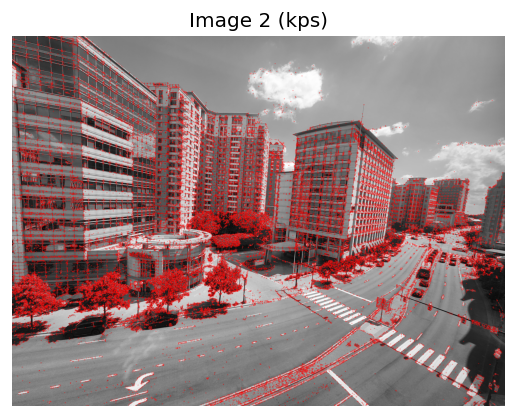

In [ ]:
# import cv

def sift_detect_and_describe(gray):
    # TODO: create SIFT and return (kps, desc)
    sift = cv2.SIFT.create()
    kps, desc = sift.detectAndCompute(gray, None)

    return kps, desc
    # raise NotImplementedError

# TODO:
# Detect the keypoints for each image and then draw them using cv2.drawKeypoints
kps1, desc1 = sift_detect_and_describe(img1)
kps2, desc2 = sift_detect_and_describe(img2)


# TODO: show('SIFT keypoints (Image 1)', vis1); show('SIFT keypoints (Image 2)', vis2)
img1_kps = cv2.drawKeypoints(img1, kps1, None, color=(255, 0, 0))
img2_kps = cv2.drawKeypoints(img2, kps2, None, color=(255, 0, 0))
show('Image 1 (kps)', img1_kps)
show('Image 2 (kps)', img2_kps)

### Putative matches
Use `BFMatcher` with KNN (k=5). Display a subset with `cv2.drawMatches`.

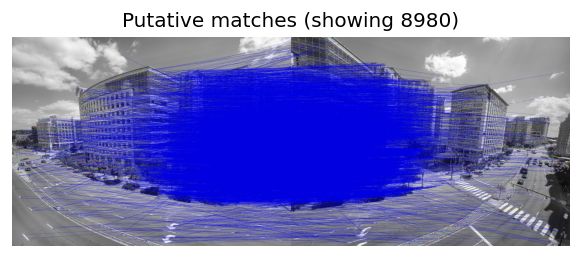

In [ ]:

def bf_knn_matches(desc_a, desc_b, k=5):
    # TODO: create BFMatcher and return bf.knnMatch
    bf = cv2.BFMatcher(crossCheck=False)
    return bf.knnMatch(desc_a, desc_b, k)
    # raise NotImplementedError

# Then below use this, choose the best matches following the assignment spec, and visualize the best


# TODO: vis_matches = cv2.drawMatches....
matches1to2 = bf_knn_matches(desc1, desc2)

best = []
ratio = 0.8

for points in matches1to2:
  if len(points) < 2:
    best.append(points[0])
  else:
    if points[0].distance < ratio * points[1].distance:
      best.append(points[0])

vis_matches = cv2.drawMatches(img1=img1, keypoints1=kps1, img2=img2, keypoints2=kps2, matches1to2=best, matchColor=(0, 0, 225), outImg=None)


# TODO: show(f'Putative matches (showing {len(best)})', vis_matches)
show(f'Putative matches (showing {len(best)})', vis_matches)

In [ ]:
print(len(kps1))
print(kps1[0])
print(matches1to2[0])

80617
< cv2.KeyPoint 0x7ee30031bb40>
(< cv2.DMatch 0x7ee32c670f90>, < cv2.DMatch 0x7ee3001927d0>, < cv2.DMatch 0x7ee3001925d0>, < cv2.DMatch 0x7ee300190390>, < cv2.DMatch 0x7ee3001930d0>)


## 3) Homography via RANSAC
Implement homography and RANSAC. Report inliers, average inlier residual, and draw inlier matches.

In [ ]:
from typing_extensions import final
from random import sample
import math, torch

def apply_homography(points_xy, H):
    # TODO
    ## Converting to homogeneous coordinates
    n = points_xy.shape[0]
    xy = np.hstack([points_xy, np.ones((n, 1))]) # add 1 col
    xy_h= (H @ xy.T).T
    w = xy_h[:, [2]]
    ## Converting from homogeneous coordinates
    xy_h /= w
    return xy_h[:, :2]


def svd_homography(xy_src, xy_dst):
    A = []
    for i in range(4):
      x, y = xy_src[i]
      x_p, y_p = xy_dst[i]
      A.append([x, y, 1, 0, 0, 0, -x_p*x, -x_p*y, -x_p])
      A.append([0, 0, 0, x, y, 1, -y_p*x, -y_p*y, -y_p])


    A = np.array(A)

    U, s, V = np.linalg.svd(A)
    # the right singular vector corresponding to smallest singular value
    h = V[-1]
    H = h.reshape(3, 3)
    # nomalized
    H = H / H[2, 2]
    return H

    # raise NotImplementedError

def ransac_homography(kps_a, kps_b, matches, num_iters=2000, inlier_tol=3.0, rng=np.random):
    # TODO: implement me
    # TODO: sample 4, estimate H, compute squared projection errors, keep best by inliers
    if isinstance(matches, (np.ndarray, torch.Tensor)): # for lightglue
      matches = np.asarray(matches)
      src = np.array([kps_a[int(i)].pt for i in matches[:, 0]], dtype=np.float32)
      dst = np.array([kps_b[int(i)].pt for i in matches[:, 1]], dtype=np.float32)
    else:
      if isinstance(kps_a, np.ndarray): # for xfeat return np
        src = np.array([kps_a[m.queryIdx] for m in matches])
        dst = np.array([kps_b[m.trainIdx] for m in matches])
      else: # SIFT + BFMatcher return cv2.DMatch
        src = np.array([kps_a[m.queryIdx].pt for m in matches])
        dst = np.array([kps_b[m.trainIdx].pt for m in matches])
        # print(src.shape)

    final_inliers = []
    final_H = None
    final_count = 0


    for _ in range(num_iters):

      idex = rng.choice(len(matches), 4, replace=False)

      if isinstance(matches, (np.ndarray, torch.Tensor)): # for lightglue
        seed_group = np.array([matches[i] for i in idex])
        src_pts = np.array([kps_a[int(i)].pt for i in seed_group[:, 0].astype(int)], dtype=np.float32) # queryIdx
        dst_pts = np.array([kps_b[int(i)].pt for i in seed_group[:, 1].astype(int)], dtype=np.float32) # trainIdx
      else:
        seed_group = [matches[i] for i in idex]
        if isinstance(kps_a, np.ndarray): # for xfeat
          src_pts = np.array([kps_a[m.queryIdx] for m in seed_group])
          dst_pts = np.array([kps_b[m.trainIdx] for m in seed_group])
        else:
          src_pts = np.array([kps_a[m.queryIdx].pt for m in seed_group])
          dst_pts = np.array([kps_b[m.trainIdx].pt for m in seed_group])

      H = svd_homography(src_pts, dst_pts)
      ## Convert p’ from homogeneous to image coordinates
      xy_proj = apply_homography(src, H)
      errs = np.sqrt(np.sum((xy_proj - dst) ** 2, axis=1))
      is_inliers = errs < inlier_tol
      num_inliers = np.sum(is_inliers)
      if num_inliers > final_count:
        final_H = H
        final_count = num_inliers
        final_inliers = [matches[i] for i in range(len(matches)) if is_inliers[i]]
    # compute new project x and y on the finel H
    proj_finel = apply_homography(src, final_H)
    errs = np.sqrt(np.sum((proj_finel - dst) ** 2, axis=1))
    is_inlier = errs < inlier_tol
    ## all points mean errors, might need fix
    avg_residual = np.mean(errs[is_inlier])

    return final_H, final_inliers, avg_residual


    # raise NotImplementedError


Number of inliers SIFT: 5993
Average residual (inliers) SIFT: 1.420 pixels


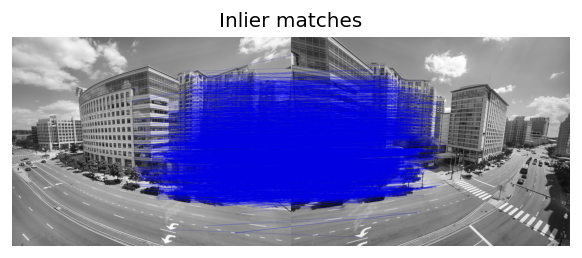

In [ ]:
# Visualize the inliers
# vis_inliers = cv2.drawMatches()......
# show('Inlier matches', vis_inliers)
H, inliers, avg_residuals = ransac_homography(kps1, kps2, best)
vis_inliers = cv2.drawMatches(img1, kps1, img2, kps2,
                              inliers,
                              None, matchColor=(0, 0, 225),
                              flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

print(f"Number of inliers SIFT: {len(inliers)}")
print(f"Average residual (inliers) SIFT: {avg_residuals:.3f} pixels")
show(f'Inlier matches', vis_inliers)

Number of inliers SIFT: 5776
Average residual (inliers) SIFT: 1.465 pixels


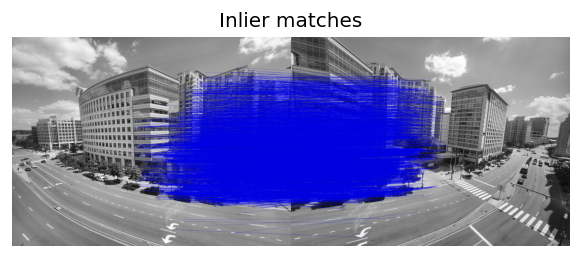

In [ ]:
H_2, inliers_2, avg_residuals_2 = ransac_homography(kps1, kps2, best, num_iters=500, inlier_tol=3.0)
vis_inliers = cv2.drawMatches(img1, kps1, img2, kps2,
                              inliers_2,
                              None, matchColor=(0, 0, 225),
                              flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

print(f"Number of inliers SIFT: {len(inliers_2)}")
print(f"Average residual (inliers) SIFT: {avg_residuals_2:.3f} pixels")
show(f'Inlier matches', vis_inliers)

Number of inliers SIFT: 1736
Average residual (inliers) SIFT: 0.650 pixels


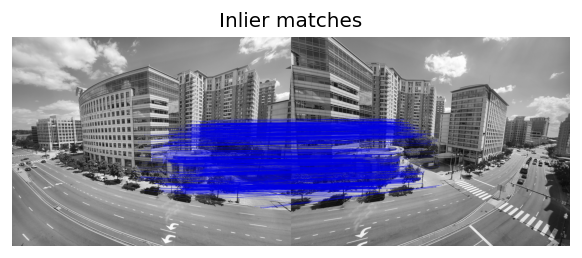

In [ ]:
H_2, inliers_2, avg_residuals_2 = ransac_homography(kps1, kps2, best, num_iters=500, inlier_tol=1.0)
vis_inliers = cv2.drawMatches(img1, kps1, img2, kps2,
                              inliers_2,
                              None, matchColor=(0, 0, 225),
                              flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

print(f"Number of inliers SIFT: {len(inliers_2)}")
print(f"Average residual (inliers) SIFT: {avg_residuals_2:.3f} pixels")
show(f'Inlier matches', vis_inliers)

I reduced the number of iterations and found that when the number of iteration reaches to a high value, the number of inliers is not changed significantly. When the inlier tolerance is reduced, the matching criterion becomes very strict, leaving only highly stable and reliable correspondences.

In [ ]:
print(H.dtype)
print(H.shape)
print("Homography:\n", H)
print("Determinant:", np.linalg.det(H))

float64
(3, 3)
Homography:
 [[-2.47979389e+01 -7.06752769e-02  4.25200902e+04]
 [-9.78136900e+00 -1.61826941e+01  2.65823188e+04]
 [-6.39983552e-03 -1.77660849e-04  1.00000000e+00]]
Determinant: -4034.2524159492827


## 4) Panorama
Warp one image onto the other using your homography with `ProjectiveTransform` + `warp`. Create a canvas and composite (average or one-sided). Show grayscale and color panoramas.

In [ ]:
def warp_to_ref(img_rgb, H_other_to_ref, ref_shape):
    # TODO: warp img_other into ref frame using H

    transform = ProjectiveTransform(H_other_to_ref)
    img_rgb = np.asarray(img_rgb, dtype=np.float32)

    h, w = ref_shape[0], ref_shape[1]

    img_w = warp(img_rgb, transform.inverse, output_shape=(h, w))
    return img_w.astype(np.float32)
    # raise NotImplementedError

def stitch_panorama(img_ref_rgb, img_other_rgb, H_other_to_ref, mode='average'):
    # TODO: create canvas; composite grayscale then color

    # project other to ref
    img_other_w = warp_to_ref(img_other_rgb, H_other_to_ref, img_ref_rgb.shape)

    # create canvas
    h, w = img_ref_rgb.shape[:2]
    stitched_img = np.zeros_like(img_ref_rgb, np.float32)
    # stiych
    # grey img
    if img_ref_rgb.ndim == 2 or img_ref_rgb.shape[2] == 1:
      # stitched_img = np.zeros((2*h, 2*w), dtype=np.float32)
      stitched_img = (img_ref_rgb + img_other_w) / 2.0

    else:
      # color img
      for c in range(3):
        # stitched_img = np.zeros((2*h, 2*w, 3), dtype=np.float32)
        stitched_img[..., c] = (img_ref_rgb[..., c] + img_other_w[..., c]) / 2.0

    return stitched_img.astype(np.float32)

    # raise NotImplementedError

ref_rgb shape: (3000, 4000)
img_rgb shape: (3000, 4000)


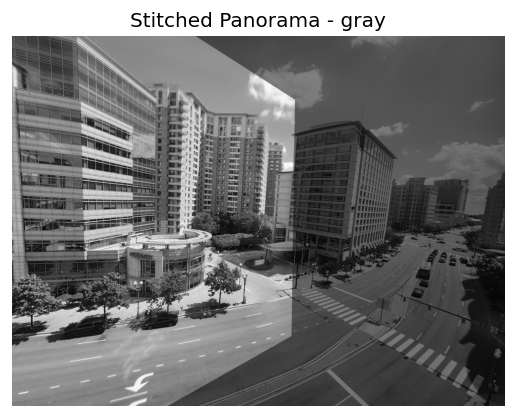

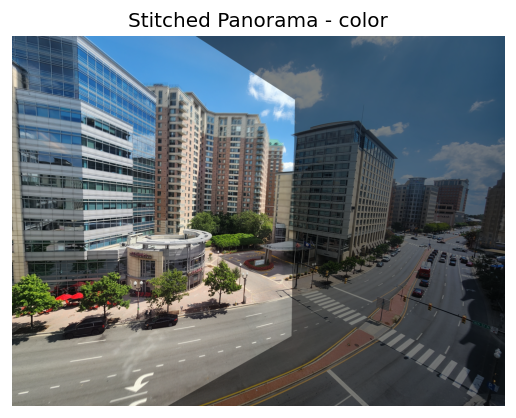

In [ ]:
print("ref_rgb shape:", img1.shape)
print("img_rgb shape:", img2.shape)


H_2 = np.asarray(H_2, dtype=np.float64)
show("Stitched Panorama - gray", stitch_panorama(img2, img1, H_2))
show("Stitched Panorama - color", stitch_panorama(img2_rgb, img1_rgb, H_2)/255.0)


## 5) Your own photos

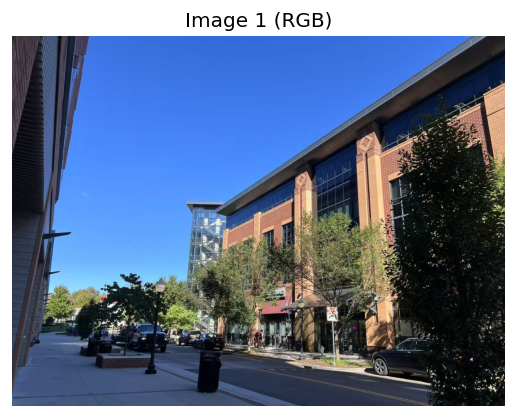

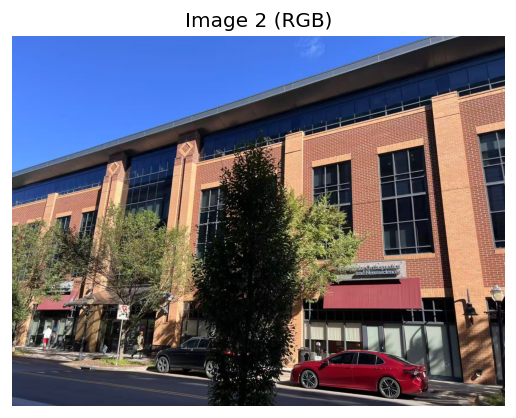

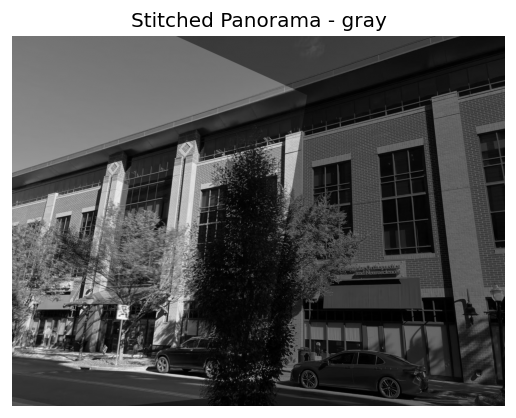

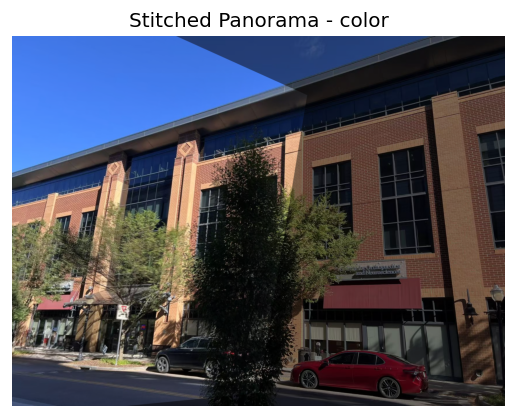

In [ ]:
# TODO: repeat pipeline for your photos
IMG1_PATH = 'img_p_1.jpg'
IMG2_PATH = 'img_p_2.jpg'

img1_rgb = imread_rgb(IMG1_PATH)
img2_rgb = imread_rgb(IMG2_PATH)
img1 = to_gray_u8(img1_rgb)
img2 = to_gray_u8(img2_rgb)

show('Image 1 (RGB)', img1_rgb)
show('Image 2 (RGB)', img2_rgb)

kps1, desc1 = sift_detect_and_describe(img1)
kps2, desc2 = sift_detect_and_describe(img2)


matches1to2 = bf_knn_matches(desc1, desc2)

best = []
ratio = 0.8

for points in matches1to2:
  if len(points) < 2:
    best.append(points[0])
  else:
    if points[0].distance < ratio * points[1].distance:
      best.append(points[0])

H, inliers, avg_residuals = ransac_homography(kps1, kps2, best)


H = np.asarray(H, dtype=np.float64)
show("Stitched Panorama - gray", stitch_panorama(img2, img1, H))
show("Stitched Panorama - color", stitch_panorama(img2_rgb, img1_rgb, H)/255.0)



## 6) XFeat (Deep learning extracted features)
Resize longer side to 640 px; limit to ~500-1000 keypoints. Use BF KNN, then do your RANSAC and show panorama.

In [ ]:
!cd /content && git clone 'https://github.com/verlab/accelerated_features.git'
%cd /content/accelerated_features

Cloning into 'accelerated_features'...
remote: Enumerating objects: 167, done.
remote: Counting objects: 100% (112/112), done.
remote: Compressing objects: 100% (76/76), done.
remote: Total 167 (delta 75), reused 36 (delta 36), pack-reused 55 (from 1)
Receiving objects: 100% (167/167), 20.10 MiB | 21.20 MiB/s, done.
Resolving deltas: 100% (79/79), done.
/content/accelerated_features


loading weights from: /content/accelerated_features/modules/../weights/xfeat.pt
loading weights from: /content/accelerated_features/modules/../weights/xfeat.pt
Number of inliers SIFT 96, Number of inliers XFeat 67
Average inlier residual SIFT 2.0050612557725405, Average inlier residual XFeat 1.4554472288101434


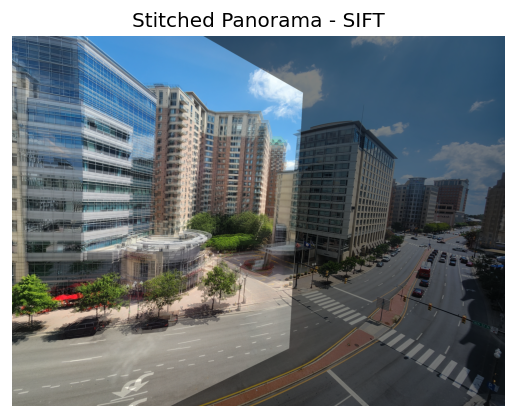

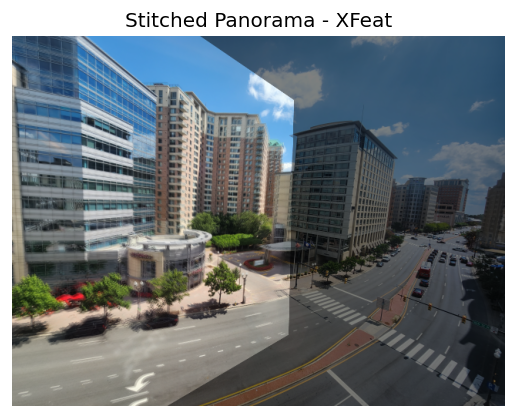

In [ ]:
from modules.xfeat import XFeat
import torch

def resize_long_side_to(img_rgb, long_side=640):
    h, w = img_rgb.shape[:2]
    s = long_side / max(h, w)
    if abs(s-1.0) < 1e-9:
        return img_rgb, 1.0
    out = cv2.resize(img_rgb, (int(round(w*s)), int(round(h*s))), interpolation=cv2.INTER_AREA)
    return out, s

def xfeat_detect_and_describe(image_rgb, top_k=1000):
    # TODO: follow XFeat minimal example; return keypoints (x,y) and (N,64) descriptors
    xfeat = XFeat()
    # resize img
    img_r, s = resize_long_side_to(image_rgb, long_side=640)
    img_tensor = torch.from_numpy(img_r).permute(2, 0, 1).unsqueeze(0) / 2550.0

    output = xfeat.detectAndCompute(img_tensor, top_k=top_k)[0]
    kps = output['keypoints'].cpu().numpy()
    desc = output['descriptors'].cpu().numpy()
    return kps, desc
    # raise NotImplementedError

# Write code below to use BF KNN using the XFeat features on your images, run RANSAC, and show the panorama created from XFeat features
kps1_xfeat, desc1_xfeat = xfeat_detect_and_describe(img1_rgb, top_k=1000)
kps2_xfeat, desc2_xfeat = xfeat_detect_and_describe(img2_rgb, top_k=1000)

matches_xfeat = bf_knn_matches(desc1_xfeat, desc2_xfeat)

best_xfeat = []

for points in matches_xfeat:
  if len(points) < 2:
    best_xfeat.append(points[0])
  else:
    if points[0].distance < ratio * points[1].distance:
      best_xfeat.append(points[0])

# print(best_xfeat[0])
H_xfeat, inlier_xfeat, avg_residuals_xfeat = ransac_homography(kps1_xfeat, kps2_xfeat, best_xfeat)

print(f"Number of inliers SIFT {len(inliers)}, Number of inliers XFeat {len(inlier_xfeat)}")
print(f"Average inlier residual SIFT {avg_residuals}, Average inlier residual XFeat {avg_residuals_xfeat}")

show("Stitched Panorama - SIFT", stitch_panorama(img2_rgb, img1_rgb, H)/255.0)

H_xfeat = np.asarray(H_xfeat, dtype=np.float64)

img1_rgb_resize, _ = resize_long_side_to(img1_rgb)
img2_rgb_resize, _ = resize_long_side_to(img2_rgb)


show("Stitched Panorama - XFeat", stitch_panorama(img2_rgb_resize, img1_rgb_resize, H_xfeat)/255.0)


## 7) LightGlue (learned matcher)
Use your SIFT features and match with LightGlue. Then RANSAC and create panorama. Compare you results to the BF KNN based method.

In [ ]:
from pathlib import Path

if Path.cwd().name != "LightGlue":
    !git clone --quiet https://github.com/cvg/LightGlue/
    %cd LightGlue
    !pip install --progress-bar off --quiet -e .

/content/accelerated_features/LightGlue
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for lightglue (pyproject.toml) ... done


tensor([1411,  470])
14
[1411  470]
Number of inliers SIFT 96, Number of inliers LightGlue 12
Average inlier residual SIFT 2.0050612557725405, Average inlier residual LightGlue 0.5233174095204628


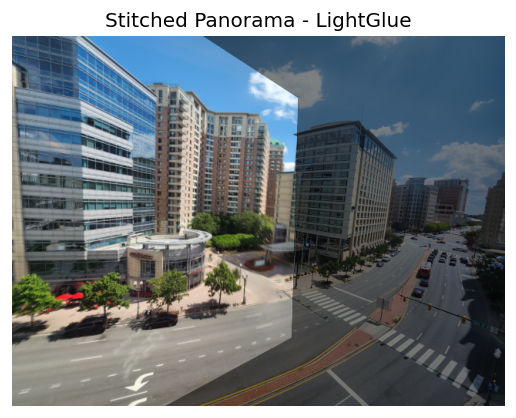

In [ ]:
from lightglue import LightGlue, SuperPoint, DISK, SIFT, ALIKED, DoGHardNet
from lightglue.utils import load_image, rbd
import cv2, torch

def lightglue_match(kps1, desc1, kps2, desc2, img1, img2):
    # TODO: implement me
    matcher = LightGlue(features="sift").eval()
    # Input (dict):
    #         image0: dict
    #             keypoints: [B x M x 2]
    #             descriptors: [B x M x D]
    #             image: [B x C x H x W] or image_size: [B x 2]
    #         image1: dict
    #             keypoints: [B x N x 2]
    #             descriptors: [B x N x D]
    #             image: [B x C x H x W] or image_size: [B x 2]
    kps1_np = torch.tensor([kp.pt for kp in kps1], dtype=torch.float32)
    kps2_np = torch.tensor([kp.pt for kp in kps2], dtype=torch.float32)
    kps1_oris = torch.tensor([kp.angle for kp in kps1], dtype=torch.float32)
    kps2_oris = torch.tensor([kp.angle for kp in kps2], dtype=torch.float32)
    kps1_scales = torch.tensor([kp.size for kp in kps1], dtype=torch.float32)
    kps2_scales = torch.tensor([kp.size for kp in kps2], dtype=torch.float32)

    feats0 = {
        'keypoints': kps1_np.unsqueeze(0),
        'descriptors': torch.from_numpy(desc1).unsqueeze(0).float(),
        'scales': kps1_scales.unsqueeze(0),
        'oris': kps1_oris.unsqueeze(0),
        'image_size': torch.tensor([[img1.shape[1], img1.shape[0]]], dtype=torch.float32)
    }
    feats1 = {
        'keypoints': kps2_np.unsqueeze(0),
        'descriptors': torch.from_numpy(desc2).unsqueeze(0).float(),
        'scales': kps2_scales.unsqueeze(0),
        'oris': kps2_oris.unsqueeze(0),
        'image_size': torch.tensor([[img2.shape[1], img2.shape[0]]], dtype=torch.float32)
    }
    matches01 = matcher({'image0': feats0, 'image1': feats1})

    feats0, feats1, matches01 = [rbd(x) for x in [feats0, feats1, matches01]]  # remove batch dimension

    matches = matches01['matches']  # indices with shape (K,2)

    return matches
    # raise NotImplementedError

# Write code below to use lightglue... ensure you do all steps required in the assignment description

img1_light, _ = resize_long_side_to(img1, long_side=640)
img2_light, _ = resize_long_side_to(img2, long_side=640)

kps1_lightglue, desc1_lightglue = sift_detect_and_describe(img1_light)
kps2_lightglue, desc2_lightglue = sift_detect_and_describe(img2_light)

# N = 9000

# kps1_lightglue = kps1_lightglue[:N]
# desc1_lightglue = desc1_lightglue[:N]
# kps2_lightglue = kps2_lightglue[:N]
# desc2_lightglue = desc2_lightglue[:N]
matches_lightglue = lightglue_match(kps1_lightglue, desc1_lightglue, kps2_lightglue, desc2_lightglue, img1_light, img2_light)

print(matches_lightglue[0])
print(len(matches_lightglue))
# print(kps2_lightglue[0])


H_lightglue, inliers_lightglue, avg_residuals_lightglue = ransac_homography(kps1_lightglue, kps2_lightglue, matches_lightglue)

# print(inliers_lightglue[0])

H_lightglue = np.asarray(H_lightglue, dtype=np.float64)

print(f"Number of inliers SIFT {len(inliers)}, Number of inliers LightGlue {len(inliers_lightglue)}")
print(f"Average inlier residual SIFT {avg_residuals}, Average inlier residual LightGlue {avg_residuals_lightglue}")

show("Stitched Panorama - LightGlue", stitch_panorama(img2_rgb_resize, img1_rgb_resize, H_lightglue)/255.0)

SIFT provides stable keypoints and mathes result, the average residules is highly related to parameters. The Xfeat is keypoints extractor based on deep learning, which provides more accurate pairs. The lightgue enchances matching quality and better performance. It extract few matched and lowest average inliers residuals.

## 8) Oxford dataset pairs
Use image 1 vs 3 for: graffiti, leuven, bikes, boat. Resize longer side to 640. Compare SIFT vs XFeat (report inliers/residual) and SIFT+BF vs SIFT+LightGlue.

In [ ]:
%cd /content

/content


In [ ]:
import matplotlib.pyplot as plt

def show_side_by_side(imgs, titles=None, cmap=None, figsize=(6,3)):
    """
    imgs: list of np.ndarray
    titles: list of str, same length as imgs
    cmap: list of colormaps or single cmap
    """
    n = len(imgs)
    plt.figure(figsize=figsize)
    for i, img in enumerate(imgs):
        plt.subplot(1, n, i + 1)

        this_cmap = cmap[i] if isinstance(cmap, list) else cmap
        if img.ndim == 2:
            plt.imshow(img, cmap=this_cmap or 'gray', vmin=0, vmax=255)
        else:
            plt.imshow(img)
        if titles:
            plt.title(titles[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()


def pipeline(img1_rgb, img2_rgb, mode="sift"):

  ## gray
  img1 = to_gray_u8(img1_rgb)
  img2 = to_gray_u8(img2_rgb)

  ## matches BF
  if mode == "sift":
    kps1, desc1 = sift_detect_and_describe(img1)
    kps2, desc2 = sift_detect_and_describe(img2)
    bf = cv2.BFMatcher(crossCheck=False)
    matches1to2 = bf.match(desc1, desc2)
    H, inliers, avg_residuals = ransac_homography(kps1, kps2, matches=matches1to2)
    H = np.asarray(H, dtype=np.float64)
    return H, inliers, avg_residuals
  ## xfeat + bf matcher
  elif mode == "xfeat":
    kps1, desc1 = xfeat_detect_and_describe(img1_rgb, top_k=1000)
    kps2, desc2 = xfeat_detect_and_describe(img2_rgb, top_k=1000)
    bf = cv2.BFMatcher(crossCheck=False)
    matches1to2 = bf.match(desc1, desc2)
    H, inliers, avg_residuals = ransac_homography(kps1, kps2, matches=matches1to2)
    H = np.asarray(H, dtype=np.float64)
    return H, inliers, avg_residuals
  ##
  elif mode == "lightglue":
    kps1, desc1 = sift_detect_and_describe(img1)
    kps2, desc2 = sift_detect_and_describe(img2)
    matches1to2 = lightglue_match(kps1, desc1, kps2, desc2, img1, img2)
    H, inliers, avg_residuals = ransac_homography(kps1, kps2, matches=matches1to2)
    H = np.asarray(H, dtype=np.float64)
    return H, inliers, avg_residuals


loading weights from: /content/accelerated_features/modules/../weights/xfeat.pt
loading weights from: /content/accelerated_features/modules/../weights/xfeat.pt
Viewpoint change: graffiti
Number of inliers SIFT 527, Number of inliers XFeat 196
Average inlier residual SIFT 1.6155495407460756, Average inlier residual XFeat 1.5883280523471741


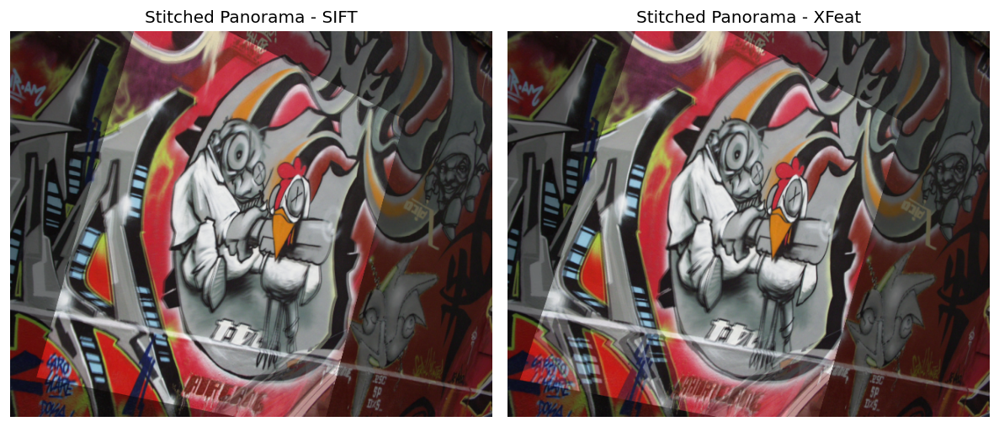

Number of inliers SIFT 527, Number of inliers LightGlue 12
Average inlier residual SIFT 1.6155495407460756, Average inlier residual LightGlue 0.9578920173665199


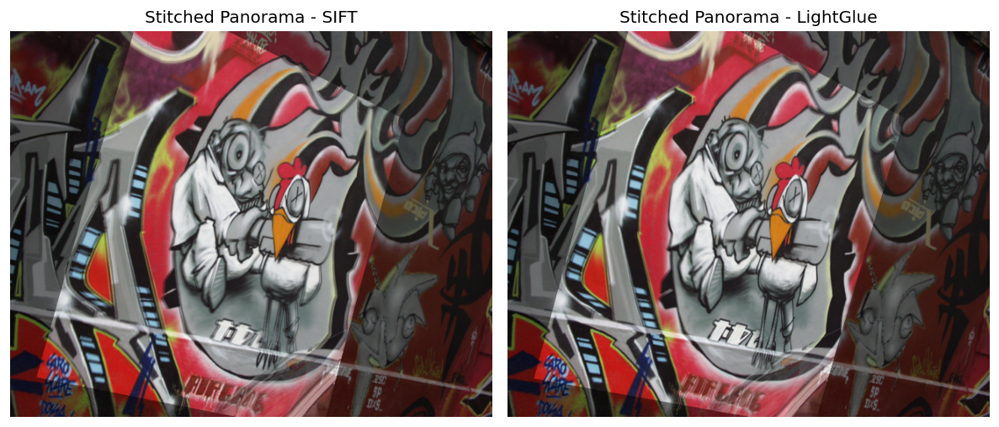

In [ ]:
# TODO: run the four pairs and assemble a small comparison figure and report stats
g1_path = 'graffiti_img1.ppm'
g2_path = 'graffiti_img3.ppm'

img1_rgb_g = imread_rgb(g1_path)
img2_rgb_g = imread_rgb(g2_path)

## resize
img1_rgb_g, _ = resize_long_side_to(img1_rgb_g, long_side=640)
img2_rgb_g, _ = resize_long_side_to(img2_rgb_g, long_side=640)

# SIFT + BF
H_sift, inliers_sift, avg_residuals_sift = pipeline(img1_rgb_g, img2_rgb_g, mode="sift")
# Xfeat + BF
H_xfeat, inliers_xfeat, avg_residuals_xfeat = pipeline(img1_rgb_g, img2_rgb_g, mode="xfeat")
# sift lightglue
H_light, inliers_light, avg_residuals_light = pipeline(img1_rgb_g, img2_rgb_g, mode="lightglue")

stitched_sift = stitch_panorama(img2_rgb_g, img1_rgb_g, H_sift) / 255.0
stitched_xfeat = stitch_panorama(img2_rgb_g, img1_rgb_g, H_xfeat) / 255.0

print("Viewpoint change: graffiti")
print(f"Number of inliers SIFT {len(inliers_sift)}, Number of inliers XFeat {len(inliers_xfeat)}")
print(f"Average inlier residual SIFT {avg_residuals_sift}, Average inlier residual XFeat {avg_residuals_xfeat}")

show_side_by_side(
    [stitched_sift, stitched_xfeat],
    ["Stitched Panorama - SIFT", "Stitched Panorama - XFeat"],
    figsize=(10, 5)
)

print(f"Number of inliers SIFT {len(inliers_sift)}, Number of inliers LightGlue {len(inliers_light)}")
print(f"Average inlier residual SIFT {avg_residuals_sift}, Average inlier residual LightGlue {avg_residuals_light}")

stitched_xfeat = stitch_panorama(img2_rgb_g, img1_rgb_g, H_light) / 255.0

show_side_by_side(
    [stitched_sift, stitched_xfeat],
    ["Stitched Panorama - SIFT", "Stitched Panorama - LightGlue"],
    figsize=(10, 5)
)


loading weights from: /content/accelerated_features/modules/../weights/xfeat.pt
loading weights from: /content/accelerated_features/modules/../weights/xfeat.pt
Illumination change: leuven
Number of inliers SIFT 608, Number of inliers XFeat 368
Average inlier residual SIFT 0.580131341304518, Average inlier residual XFeat 1.3727580714631062


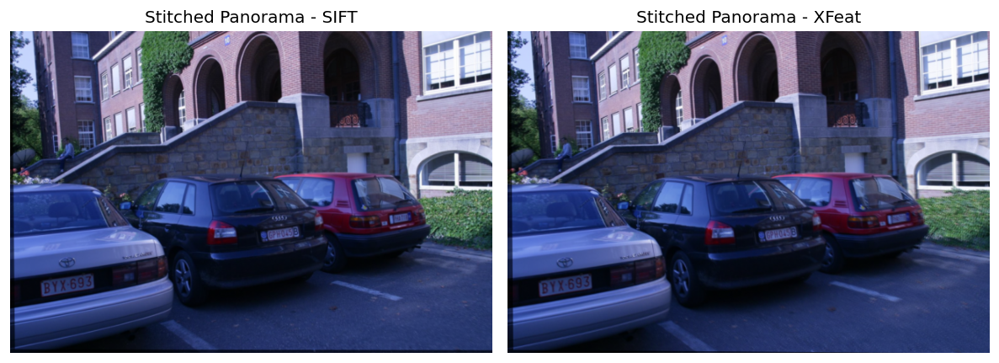

Number of inliers SIFT 608, Number of inliers LightGlue 26
Average inlier residual SIFT 0.580131341304518, Average inlier residual LightGlue 0.75683651162141


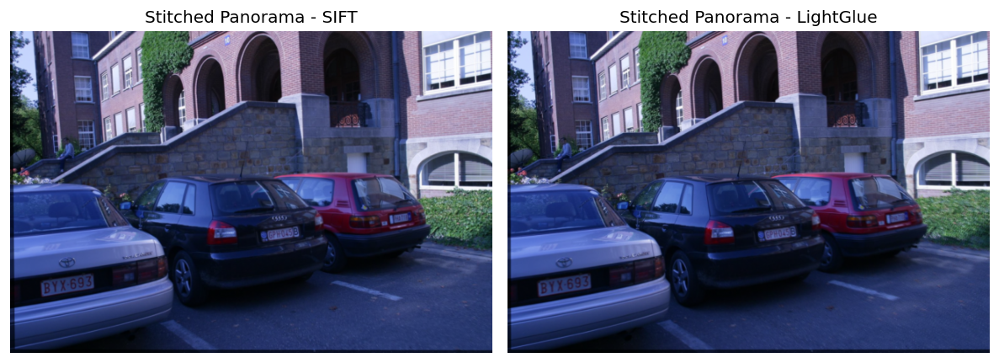

In [ ]:
g1_path = 'leuven_img1.ppm'
g2_path = 'leuven_img3.ppm'

img1_rgb_g = imread_rgb(g1_path)
img2_rgb_g = imread_rgb(g2_path)

## resize
img1_rgb_g, _ = resize_long_side_to(img1_rgb_g, long_side=640)
img2_rgb_g, _ = resize_long_side_to(img2_rgb_g, long_side=640)

# SIFT + BF
H_sift, inliers_sift, avg_residuals_sift = pipeline(img1_rgb_g, img2_rgb_g, mode="sift")
# Xfeat + BF
H_xfeat, inliers_xfeat, avg_residuals_xfeat = pipeline(img1_rgb_g, img2_rgb_g, mode="xfeat")
# sift lightglue
H_light, inliers_light, avg_residuals_light = pipeline(img1_rgb_g, img2_rgb_g, mode="lightglue")

stitched_sift = stitch_panorama(img2_rgb_g, img1_rgb_g, H_sift) / 255.0
stitched_xfeat = stitch_panorama(img2_rgb_g, img1_rgb_g, H_xfeat) / 255.0

print("Illumination change: leuven")
print(f"Number of inliers SIFT {len(inliers_sift)}, Number of inliers XFeat {len(inliers_xfeat)}")
print(f"Average inlier residual SIFT {avg_residuals_sift}, Average inlier residual XFeat {avg_residuals_xfeat}")

show_side_by_side(
    [stitched_sift, stitched_xfeat],
    ["Stitched Panorama - SIFT", "Stitched Panorama - XFeat"],
    figsize=(10, 5)
)

print(f"Number of inliers SIFT {len(inliers_sift)}, Number of inliers LightGlue {len(inliers_light)}")
print(f"Average inlier residual SIFT {avg_residuals_sift}, Average inlier residual LightGlue {avg_residuals_light}")

stitched_xfeat = stitch_panorama(img2_rgb_g, img1_rgb_g, H_light) / 255.0

show_side_by_side(
    [stitched_sift, stitched_xfeat],
    ["Stitched Panorama - SIFT", "Stitched Panorama - LightGlue"],
    figsize=(10, 5)
)

loading weights from: /content/accelerated_features/modules/../weights/xfeat.pt
loading weights from: /content/accelerated_features/modules/../weights/xfeat.pt
Motion blur: bikes
Number of inliers SIFT 608, Number of inliers XFeat 354
Average inlier residual SIFT 0.6116650782294965, Average inlier residual XFeat 1.4564414515235848


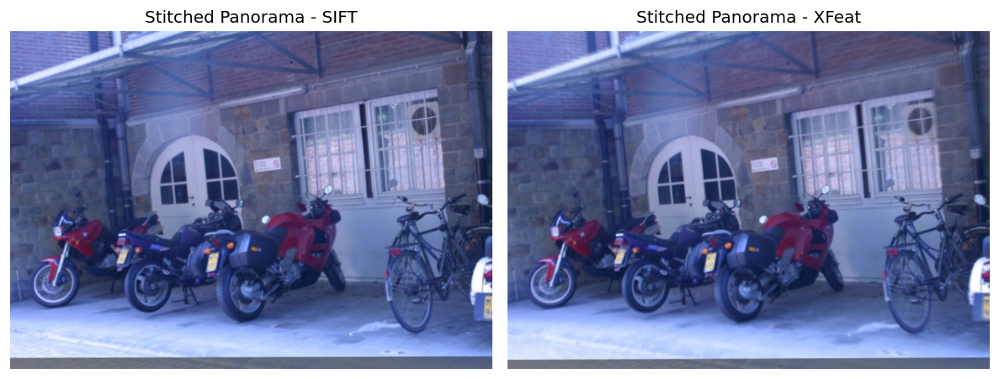

Number of inliers SIFT 608, Number of inliers LightGlue 25
Average inlier residual SIFT 0.6116650782294965, Average inlier residual LightGlue 0.2858284795840234


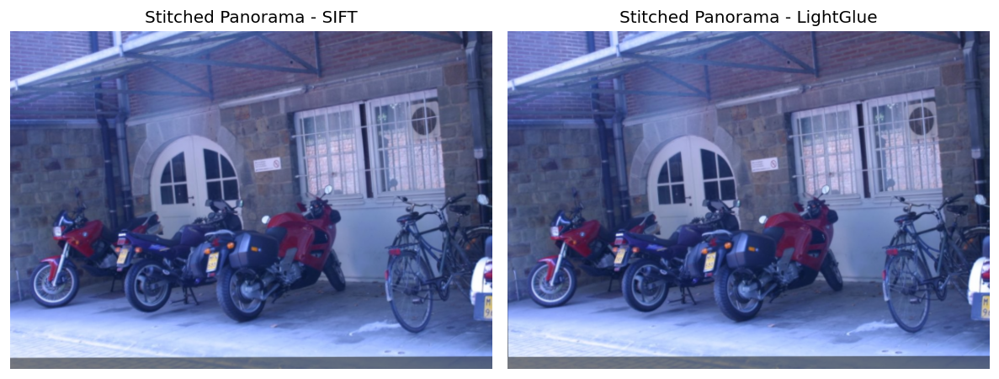

In [ ]:
g1_path = 'bike_img1.ppm'
g2_path = 'bike_img3.ppm'

img1_rgb_g = imread_rgb(g1_path)
img2_rgb_g = imread_rgb(g2_path)

## resize
img1_rgb_g, _ = resize_long_side_to(img1_rgb_g, long_side=640)
img2_rgb_g, _ = resize_long_side_to(img2_rgb_g, long_side=640)

# SIFT + BF
H_sift, inliers_sift, avg_residuals_sift = pipeline(img1_rgb_g, img2_rgb_g, mode="sift")
# Xfeat + BF
H_xfeat, inliers_xfeat, avg_residuals_xfeat = pipeline(img1_rgb_g, img2_rgb_g, mode="xfeat")
# sift lightglue
H_light, inliers_light, avg_residuals_light = pipeline(img1_rgb_g, img2_rgb_g, mode="lightglue")

stitched_sift = stitch_panorama(img2_rgb_g, img1_rgb_g, H_sift) / 255.0
stitched_xfeat = stitch_panorama(img2_rgb_g, img1_rgb_g, H_xfeat) / 255.0

print("Motion blur: bikes")
print(f"Number of inliers SIFT {len(inliers_sift)}, Number of inliers XFeat {len(inliers_xfeat)}")
print(f"Average inlier residual SIFT {avg_residuals_sift}, Average inlier residual XFeat {avg_residuals_xfeat}")

show_side_by_side(
    [stitched_sift, stitched_xfeat],
    ["Stitched Panorama - SIFT", "Stitched Panorama - XFeat"],
    figsize=(10, 5)
)

print(f"Number of inliers SIFT {len(inliers_sift)}, Number of inliers LightGlue {len(inliers_light)}")
print(f"Average inlier residual SIFT {avg_residuals_sift}, Average inlier residual LightGlue {avg_residuals_light}")

stitched_xfeat = stitch_panorama(img2_rgb_g, img1_rgb_g, H_light) / 255.0

show_side_by_side(
    [stitched_sift, stitched_xfeat],
    ["Stitched Panorama - SIFT", "Stitched Panorama - LightGlue"],
    figsize=(10, 5)
)

loading weights from: /content/accelerated_features/modules/../weights/xfeat.pt
loading weights from: /content/accelerated_features/modules/../weights/xfeat.pt
Illumination change: leuven
Number of inliers SIFT 1322, Number of inliers XFeat 246
Average inlier residual SIFT 0.7161545773057708, Average inlier residual XFeat 1.6272635044454284


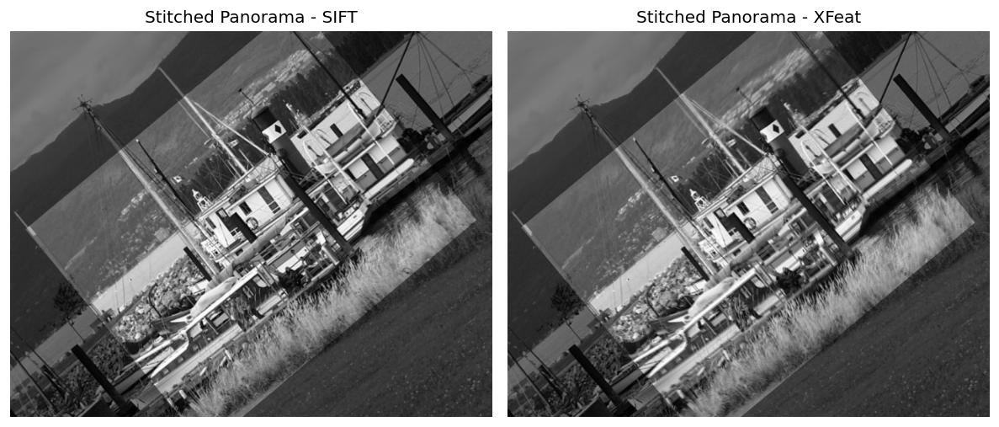

Number of inliers SIFT 1322, Number of inliers LightGlue 23
Average inlier residual SIFT 0.7161545773057708, Average inlier residual LightGlue 0.5020495674599896


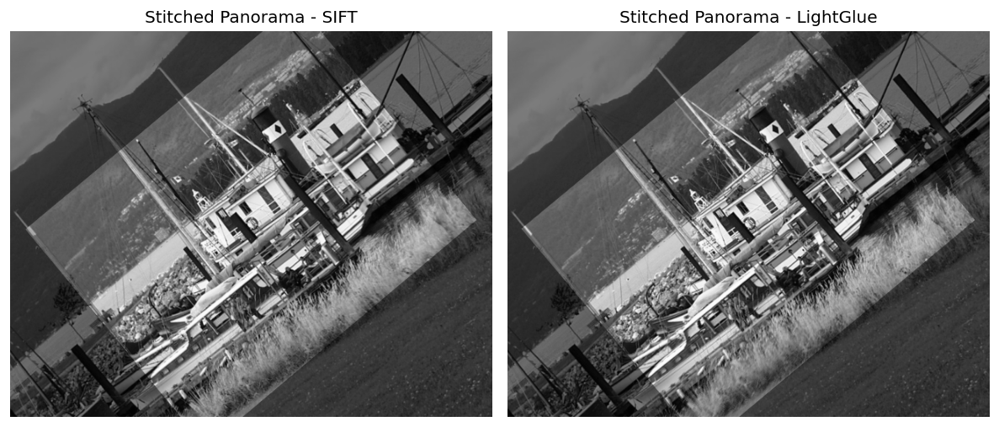

In [ ]:
g1_path = 'boat_img1.pgm'
g2_path = 'boat_img3.pgm'

img1_rgb_g = imread_rgb(g1_path)
img2_rgb_g = imread_rgb(g2_path)

## resize
img1_rgb_g, _ = resize_long_side_to(img1_rgb_g, long_side=640)
img2_rgb_g, _ = resize_long_side_to(img2_rgb_g, long_side=640)

# SIFT + BF
H_sift, inliers_sift, avg_residuals_sift = pipeline(img1_rgb_g, img2_rgb_g, mode="sift")
# Xfeat + BF
H_xfeat, inliers_xfeat, avg_residuals_xfeat = pipeline(img1_rgb_g, img2_rgb_g, mode="xfeat")
# sift lightglue
H_light, inliers_light, avg_residuals_light = pipeline(img1_rgb_g, img2_rgb_g, mode="lightglue")

stitched_sift = stitch_panorama(img2_rgb_g, img1_rgb_g, H_sift) / 255.0
stitched_xfeat = stitch_panorama(img2_rgb_g, img1_rgb_g, H_xfeat) / 255.0

print("Illumination change: leuven")
print(f"Number of inliers SIFT {len(inliers_sift)}, Number of inliers XFeat {len(inliers_xfeat)}")
print(f"Average inlier residual SIFT {avg_residuals_sift}, Average inlier residual XFeat {avg_residuals_xfeat}")

show_side_by_side(
    [stitched_sift, stitched_xfeat],
    ["Stitched Panorama - SIFT", "Stitched Panorama - XFeat"],
    figsize=(10, 5)
)

print(f"Number of inliers SIFT {len(inliers_sift)}, Number of inliers LightGlue {len(inliers_light)}")
print(f"Average inlier residual SIFT {avg_residuals_sift}, Average inlier residual LightGlue {avg_residuals_light}")

stitched_xfeat = stitch_panorama(img2_rgb_g, img1_rgb_g, H_light) / 255.0

show_side_by_side(
    [stitched_sift, stitched_xfeat],
    ["Stitched Panorama - SIFT", "Stitched Panorama - LightGlue"],
    figsize=(10, 5)
)

## 9) Short analysis
Write a brief paragraph analyzing your results.

# Part 3: Epipolar geometry

In this part, reuse your inlier correspondences from Part 2 above for each configuration.

You will recover the fundamental matrix with OpenCV (8-point), compute epilines by matrix multiplications, plot the matches with their epilines, and compute and print the epipoles. You'll then repeat these steps on the challenge pairs from Part 2 as well (should just be a copy and apply of your code).

### 3.1 Gather inlier correspondences from Part 2
Create `(N,2)` arrays of corresponding points for each configuration. Use only inliers from your RANSAC.
Name them as below so subsequent cells can use them.

In [ ]:
# Required inputs from Part 2 (fill these from your Part 2 results)

# --- SIFT + BF ---
# kps1, desc1 = sift_detect_and_describe(img1)
# kps2, desc2 = sift_detect_and_describe(img2)
bf = cv2.BFMatcher(crossCheck=False)
matches1to2 = bf.match(desc1, desc2)
H, inliers, avg_residuals = ransac_homography(kps1, kps2, matches=matches1to2)
H = np.asarray(H, dtype=np.float64)

p1_sift = np.array([kps1[m.queryIdx].pt for m in inliers], dtype=np.float32)
p2_sift = np.array([kps2[m.trainIdx].pt for m in inliers], dtype=np.float32)

# print(p1_sift.shape, p2_sift.shape)


# --- XFeat + BF ---
p1_xfeat = np.array([kps1_xfeat[m.queryIdx] for m in inlier_xfeat])
p2_xfeat = np.array([kps2_xfeat[m.trainIdx] for m in inlier_xfeat])

# print(p1_xfeat[0])

# print(inliers_lightglue[0])

# --- SIFT + LightGlue ---
inliers_lightglue = np.array(inliers_lightglue)
p1_lg = np.array([kps1_lightglue[int(i)].pt for i in inliers_lightglue[:, 0]], dtype=np.float32)
p2_lg = np.array([kps2_lightglue[int(i)].pt for i in inliers_lightglue[:, 1]], dtype=np.float32)

# print(p1_lg[0])


(96, 2) (96, 2)


### 3.2 Fundamental matrix
Use OpenCV’s `findFundamentalMat` with the 8-point option. You do not need to implement the solver.
The fundamental matrix depends on image order, so be consistent with which image is considered first.

In [ ]:
import cv2
import numpy as np

def compute_fundamental_8point(p1, p2):
    #   TODO: Return (F, inlier_mask)
    #   p1, p2 are arrays (N,2) with corresponding inlier points from Part 2
    #   You may pass None for the mask (trusting your RANSAC inliers), or use the returned mask.
    F, inlier_mask = cv2.findFundamentalMat(p1, p2, cv2.FM_8POINT)
    return F, inlier_mask

    # raise NotImplementedError


F_sift, mask_sift = compute_fundamental_8point(p1_sift, p2_sift)
print('F (SIFT+BF):\n', F_sift)


F (SIFT+BF):
 [[ 1.59316455e-07  1.38727557e-06 -2.16965777e-03]
 [-8.21112354e-07  5.88050674e-08  3.52486296e-03]
 [ 6.14146321e-04 -3.46730143e-03  1.00000000e+00]]


### 3.3 Epilines and visualization
Implement the linear algebra below to get the epilines and print them. Limit to 10 best matches per configuration.

In the figure, draw each matched pair and both epilines using the same random color.

In [ ]:
def to_homogeneous(points):
    # TODO
    pts = np.array(points)
    ones = np.ones((pts.shape[0], 1))
    return np.hstack([pts, ones])

def epilines_2_from_1(F, p1):
    # TODO: lines in image 2 for points in image 1.
    p1_th = to_homogeneous(p1)
    epilines = F @ p1_th.T
    return epilines.T
    # raise NotImplementedError

def epilines_1_from_2(F, p2):
    # TODO: lines in image 1 for points in image 2.
    p2_th = to_homogeneous(p2)
    epilines = F.T @ p2_th.T
    return epilines.T
    # raise NotImplementedError

def select_top_k(pA, pB, scores_or_residuals=None, k=10):
    # TODO: Select up to k pairs for visualization (e.g. smallest resiauals or highest conf).
    # return pA_k, pB_k.
    n = min(pA.shape[0], k)
    if scores_or_residuals is None:
        idx = np.random.choice(pA.shape[0], n, replace=False)
    return pA[:n], pB[:n]
    # raise NotImplementedError

def plot_matches_with_epilines(img1_rgb, img2_rgb, p1_k, p2_k, F, title=''):
     # TODO: Make one fig with the two images side by side. For each pair (p1,p2), plot the points (markers) and draw
     # the epiline in the other image and use the same random color for the pair.
     h1, w1 = img1_rgb.shape[:2]
     h2, w2 = img2_rgb.shape[:2]

     line1 = epilines_1_from_2(F, p2_k)
     line2 = epilines_2_from_1(F, p1_k)

     fig, ax = plt.subplots(1, 2, figsize=(6, 3))
     ax[0].imshow(img1_rgb)
     ax[1].imshow(img2_rgb)

     for (r1, pt1, r2, pt2) in zip(line1, p1_k, line2, p2_k):
      color = tuple(np.random.rand(3))

      x0, y0 = map(int, [0, -r1[2]/r1[1]])
      x1, y1 = map(int, [w1, -(r1[2] + r1[0]*w1)/r1[1]])
      ax[0].plot([x0, x1], [y0, y1], color=color)
      ax[0].scatter(pt1[0], pt1[1], color=color, s=40, marker='o')

      x0, y0 = map(int, [0, -r2[2]/r2[1]])
      x1, y1 = map(int, [w2, -(r1[2] + r2[0]*w2)/r2[1]])
      ax[1].plot([x0, x1], [y0, y1], color=color)
      ax[1].scatter(pt2[0], pt2[1], color=color, s=40, marker='o')
     plt.suptitle(f"{title}")
    # raise NotImplementedError


### 3.4 Epipoles
Compute epipoles. Convert from homogeneous to cartesian by dividing by the last entry.

In [ ]:
def compute_epipoles(F):
    # TODO: write code to return (e1, e2) as 2D Cartesian points.
    w1, v1 = np.linalg.eig(F.T @ F)
    e1_h = v1[:, np.argmin(np.real(w1))].real

    w1, v2 = np.linalg.eig(F @ F.T)
    e2_h = v2[:, np.argmin(np.real(w1))].real

    e1 = e1_h / e1_h[-1]
    e2 = e2_h / e2_h[-1]

    e1 = e1[:2]
    e2 = e2[:2]

    print("Epipole in image 1 (x, y):", e1)
    print("Epipole in image 2 (x, y):", e2)

    return e1, e2
    # raise NotImplementedError

### 3.5 Report
For each config (SIFT+BF, XFeat+BF, SIFT+LightGlue):
1) Compute and print `F` 2) select up to 10 matches and plot matches+epilines, 3) compute/print epipoles.


SIFT+BF — Fundamental matrix:
 [[ 1.59316455e-07  1.38727557e-06 -2.16965777e-03]
 [-8.21112354e-07  5.88050674e-08  3.52486296e-03]
 [ 6.14146321e-04 -3.46730143e-03  1.00000000e+00]]
Epipole in image 1 (x, y): [4368.86401875 1062.24446693]
Epipole in image 2 (x, y): [2447.52605398 1222.8259557 ]
SIFT+BF — epipole in image 1: [4368.86401875 1062.24446693]
SIFT+BF — epipole in image 2: [2447.52605398 1222.8259557 ]

XFeat+BF — Fundamental matrix:
 [[-2.41738396e-06 -5.62098245e-06  1.46174817e-03]
 [ 1.64015234e-05  2.87199687e-07 -2.56903305e-03]
 [-2.52576132e-03 -3.15715841e-03  1.00000000e+00]]
Epipole in image 1 (x, y): [153.23410642 194.15155686]
Epipole in image 2 (x, y): [-558.00766177   71.75202521]
XFeat+BF — epipole in image 1: [153.23410642 194.15155686]
XFeat+BF — epipole in image 2: [-558.00766177   71.75202521]

SIFT+LightGlue — Fundamental matrix:
 [[-5.73614486e-07 -4.03008738e-06  1.02843982e-03]
 [ 1.27095043e-05  1.82013906e-07 -1.95921174e-03]
 [-2.74744436e-03 -2

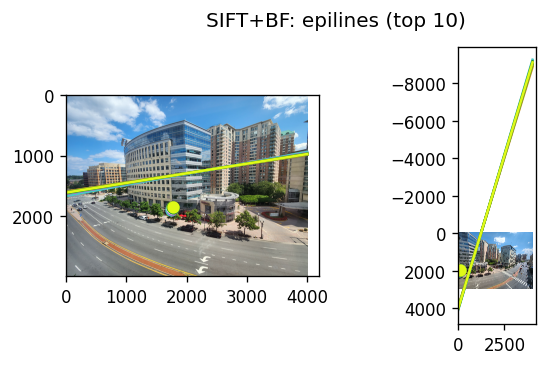

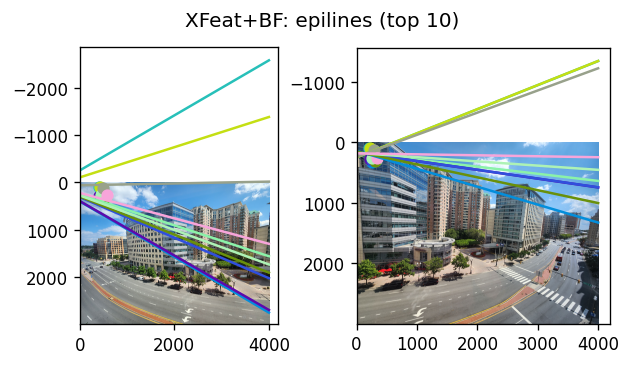

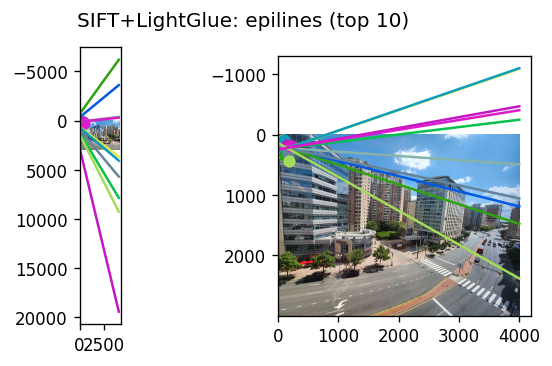

In [ ]:
# Example
for name, (p1, p2) in {
    'SIFT+BF': (p1_sift, p2_sift),
    'XFeat+BF': (p1_xfeat, p2_xfeat),
    'SIFT+LightGlue': (p1_lg, p2_lg),
}.items():
    F, _ = compute_fundamental_8point(p1, p2)
    print(f'\n{name} — Fundamental matrix:\n', F)
    p1k, p2k = select_top_k(p1, p2, scores_or_residuals=None, k=10)
    plot_matches_with_epilines(img1_rgb, img2_rgb, p1k, p2k, F, title=f'{name}: epilines (top 10)')
    e1, e2 = compute_epipoles(F)
    print(f'{name} — epipole in image 1:', e1)
    print(f'{name} — epipole in image 2:', e2)

### 3.6 Challenge pairs
Repeat **3.5** on the small challenge pairs yu used in Part 2 (e.g. Oxford pairs). Make one figure per configuration for each pair (limit to 10 matches) and print both epipoles for each (this is just re-running above).

loading weights from: /content/accelerated_features/modules/../weights/xfeat.pt
loading weights from: /content/accelerated_features/modules/../weights/xfeat.pt

SIFT+BF — Fundamental matrix:
 [[ 1.43873870e-06 -1.74202207e-06 -2.35825838e-03]
 [ 1.73269672e-06  1.45941974e-06 -3.63636541e-03]
 [-8.53124993e-04  2.81268178e-03  1.00000000e+00]]
Epipole in image 1 (x, y): [1910.13857422  223.83867321]
Epipole in image 2 (x, y): [1195.476529  -500.2914554]
SIFT+BF — epipole in image 1: [1910.13857422  223.83867321]
SIFT+BF — epipole in image 2: [1195.476529  -500.2914554]

XFeat+BF — Fundamental matrix:
 [[-2.05214169e-07  6.05468329e-07 -3.43167465e-03]
 [-2.73673051e-07 -2.60456169e-07 -3.43838092e-03]
 [ 3.45098338e-04  3.45847827e-03  1.00000000e+00]]
Epipole in image 1 (x, y): [-13578.07926706   1065.7209052 ]
Epipole in image 2 (x, y): [-3908.78697583  4191.99778015]
XFeat+BF — epipole in image 1: [-13578.07926706   1065.7209052 ]
XFeat+BF — epipole in image 2: [-3908.78697583  4191

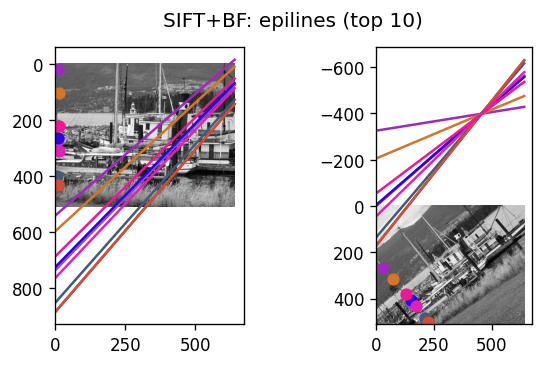

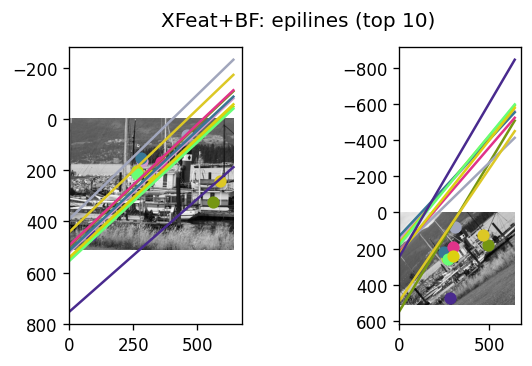

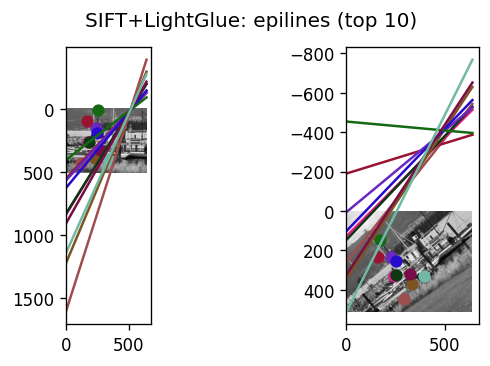

In [ ]:
# TODO: loop over your challenge pairs and repeat the same steps as in 3.5

g1_path = 'boat_img1.pgm'
g2_path = 'boat_img3.pgm'

img1_rgb_g = imread_rgb(g1_path)
img2_rgb_g = imread_rgb(g2_path)

## resize
img1_rgb_g, _ = resize_long_side_to(img1_rgb_g, long_side=640)
img2_rgb_g, _ = resize_long_side_to(img2_rgb_g, long_side=640)

img1 = to_gray_u8(img1_rgb_g)
img2 = to_gray_u8(img2_rgb_g)

# --- SIFT + BF ---
kps1, desc1 = sift_detect_and_describe(img1)
kps2, desc2 = sift_detect_and_describe(img2)
bf = cv2.BFMatcher(crossCheck=False)
matches1to2 = bf.match(desc1, desc2)
H, inliers, avg_residuals = ransac_homography(kps1, kps2, matches=matches1to2)
H = np.asarray(H, dtype=np.float64)

p1_sift = np.array([kps1[m.queryIdx].pt for m in inliers], dtype=np.float32)
p2_sift = np.array([kps2[m.trainIdx].pt for m in inliers], dtype=np.float32)

# print(p1_sift.shape, p2_sift.shape)


# --- XFeat + BF ---
kps1_xfeat, desc1 = xfeat_detect_and_describe(img1_rgb_g, top_k=1000)
kps2_xfeat, desc2 = xfeat_detect_and_describe(img2_rgb_g, top_k=1000)
bf = cv2.BFMatcher(crossCheck=False)
matches1to2 = bf.match(desc1, desc2)
H, inliers_xfeat, avg_residuals = ransac_homography(kps1_xfeat, kps2_xfeat, matches=matches1to2)
p1_xfeat = np.array([kps1_xfeat[m.queryIdx] for m in inliers_xfeat])
p2_xfeat = np.array([kps2_xfeat[m.trainIdx] for m in inliers_xfeat])

# print(p1_xfeat[0])

# print(inliers_lightglue[0])

# --- SIFT + LightGlue ---
kps1_l, desc1 = sift_detect_and_describe(img1)
kps2_l, desc2 = sift_detect_and_describe(img2)
matches1to2 = lightglue_match(kps1_l, desc1, kps2_l, desc2, img1, img2)
H, inliers_lightglue, avg_residuals = ransac_homography(kps1_l, kps2_l, matches=matches1to2)
inliers_lightglue = np.array(inliers_lightglue)
p1_lg = np.array([kps1_l[int(i)].pt for i in inliers_lightglue[:, 0]], dtype=np.float32)
p2_lg = np.array([kps2_l[int(i)].pt for i in inliers_lightglue[:, 1]], dtype=np.float32)

# print(p1_lg[0])

# Example
for name, (p1, p2) in {
    'SIFT+BF': (p1_sift, p2_sift),
    'XFeat+BF': (p1_xfeat, p2_xfeat),
    'SIFT+LightGlue': (p1_lg, p2_lg),
}.items():
    F, _ = compute_fundamental_8point(p1, p2)
    print(f'\n{name} — Fundamental matrix:\n', F)
    p1k, p2k = select_top_k(p1, p2, scores_or_residuals=None, k=10)
    plot_matches_with_epilines(img1_rgb_g, img2_rgb_g, p1k, p2k, F, title=f'{name}: epilines (top 10)')
    e1, e2 = compute_epipoles(F)
    print(f'{name} — epipole in image 1:', e1)
    print(f'{name} — epipole in image 2:', e2)